# Simulation Practice

created: March 17, 2025 <br>
last modified:  March 17, 2025

description.

In [26]:
# Imports
from neurodsp.sim.aperiodic import sim_synaptic_current
from neurodsp.spectral import compute_spectrum
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from specparam import SpectralModel
from specparam.plts.annotate import plot_annotated_model

In [2]:
# settings
n_seconds = 120 #sec
FS=1000
time = np.linspace(0, n_seconds, num=n_seconds*FS)

[Text(0.5, 0, 'frequency (Hz)'),
 Text(0, 0.5, 'power'),
 Text(0.5, 1.0, 'Power Spectral Density')]

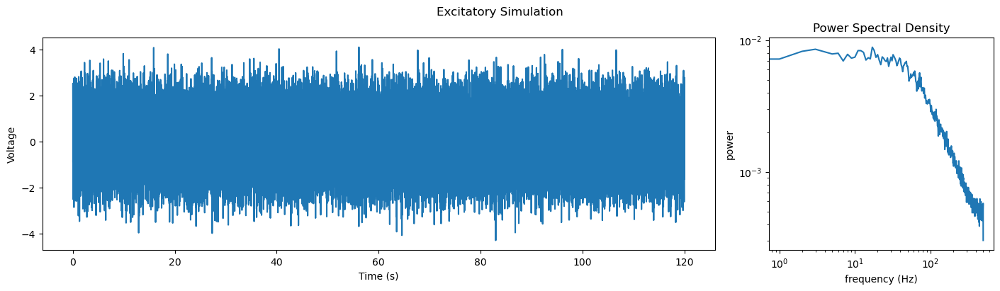

In [37]:
# simulate excitatory signal

sig = sim_synaptic_current(n_seconds=n_seconds, fs=FS, n_neurons=8000, tau_r=0.0001, tau_d=0.002)
freq, psd = compute_spectrum(sig, FS, method='welch', avg_type='mean')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[14,4], gridspec_kw={'width_ratios': [3, 1]}, constrained_layout=True)
fig.suptitle("Excitatory Simulation")
# plot signal
ax1.plot(time, sig)
ax1.set_xlabel("Time (s)")
ax1.set_ylabel("Voltage")

#plot spectra
ax2.loglog(freq, psd)
ax2.set(xlabel='frequency (Hz)', ylabel='power', title='Power Spectral Density')


	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 4 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                         Aperiodic Parameters (offset, knee, exponent):                           
                                    2.3464, 28490

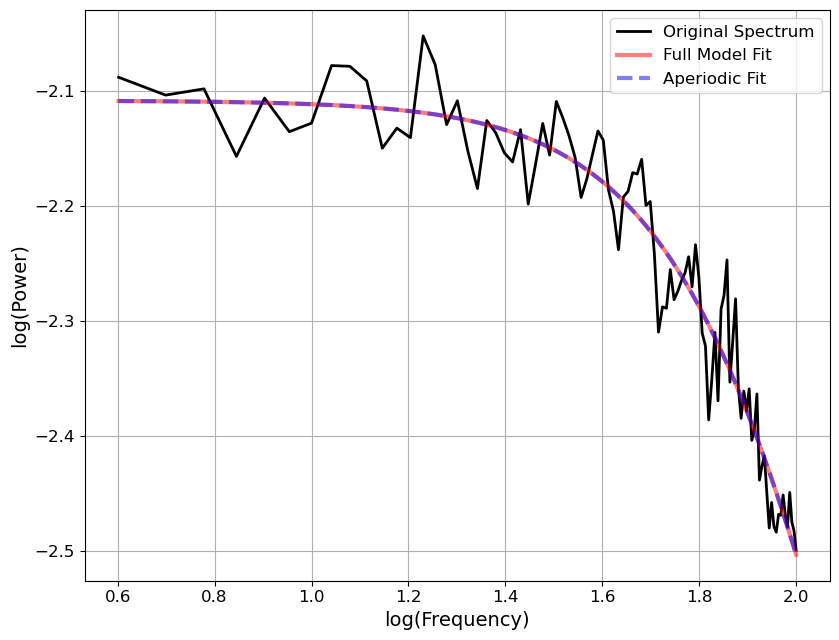

In [38]:
# apply specparam
fm = SpectralModel(aperiodic_mode='knee', max_n_peaks=0)

freq_range = [4, 100]

fm.report(freq, psd, freq_range, plt_log=True)

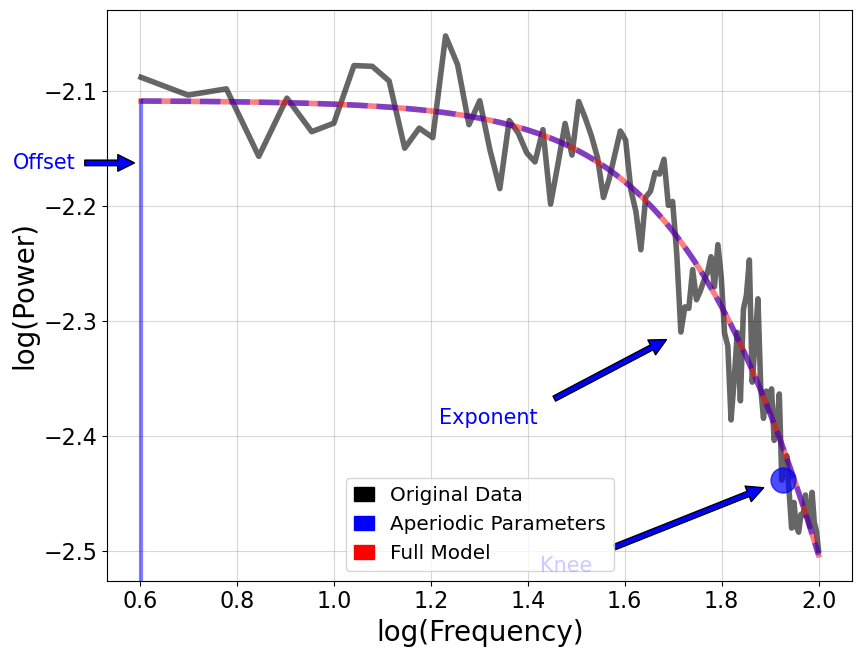

In [39]:
plot_annotated_model(fm, plt_log=True, annotate_peaks=False)

[Text(0.5, 0, 'frequency (Hz)'),
 Text(0, 0.5, 'power'),
 Text(0.5, 1.0, 'Power Spectral Density')]

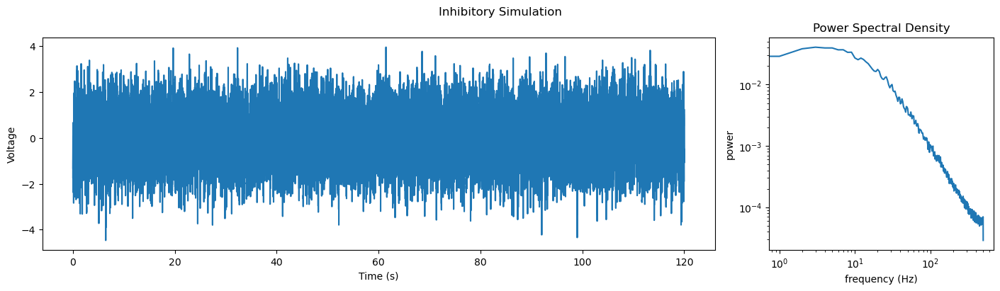

In [31]:
# simulate inhibitory signal

sig = sim_synaptic_current(n_seconds=n_seconds, fs=FS, n_neurons=2000, tau_r=0.0005, tau_d=0.01)
freq, psd = compute_spectrum(sig, FS)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[14,4], gridspec_kw={'width_ratios': [3, 1]}, constrained_layout=True)
fig.suptitle("Inhibitory Simulation")
# plot signal
ax1.plot(time, sig)
ax1.set_xlabel("Time (s)")
ax1.set_ylabel("Voltage")

#plot spectra
ax2.loglog(freq, psd)
ax2.set(xlabel='frequency (Hz)', ylabel='power', title='Power Spectral Density')


	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 4 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                         Aperiodic Parameters (offset, knee, exponent):                           
                                     1.1236, 326.

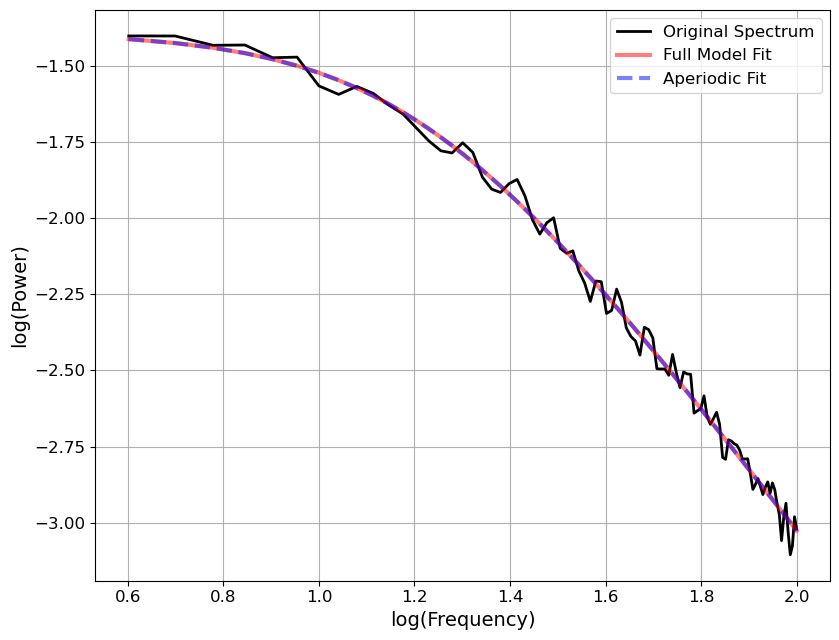

In [32]:
# apply specparam
fm2 = SpectralModel(aperiodic_mode='knee', max_n_peaks=0)

freq_range = [4, 100]

fm2.report(freq, psd, freq_range, plt_log=True)

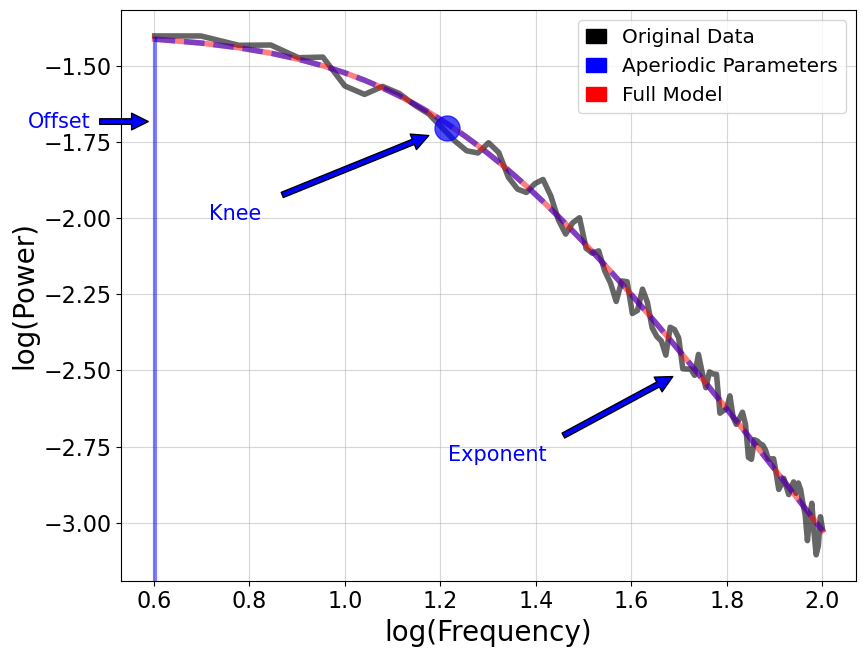

In [35]:
plot_annotated_model(fm2, annotate_peaks=False, plt_log=True)

(-5.0, 5.0)

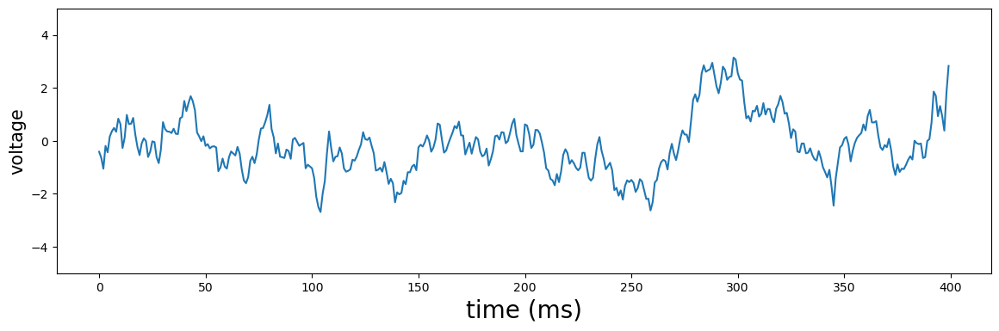

In [34]:
# choose time window for animation
# 200ms example of sim LFP
mini_window = np.arange(400)

mini_sig = sig[500:900]
mini_time = np.linspace(0, mini_window)

fig, ax = plt.subplots(figsize=[14,4])
ax.plot(mini_window, mini_sig)
ax.set_xlabel("time (ms)", fontsize=20)
ax.set_ylabel("voltage", fontsize=15)
ax.set_ylim([-5,5])


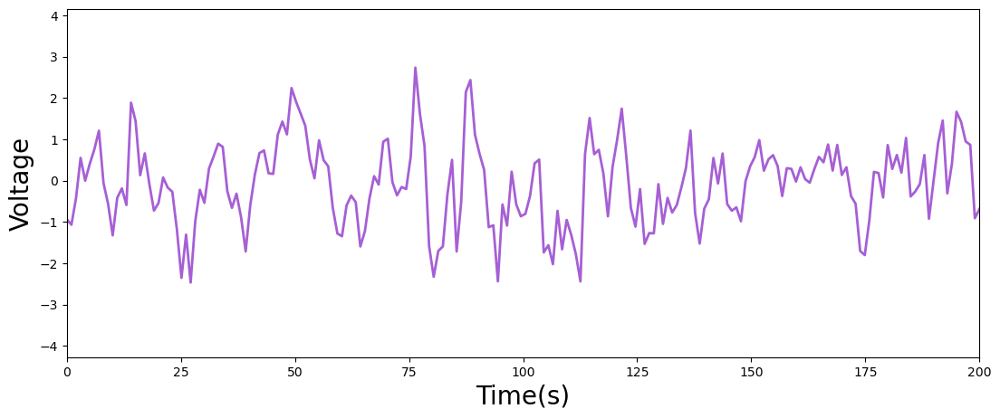

In [27]:
# Parameters for animation
from IPython.display import HTML

animation_duration = 3  # Total animation length (seconds)
window_size = int(0.2 * FS)  # 200ms window (200 samples)
fps = 30  # Frames per second
num_frames = animation_duration * fps  


start_index = 40 * FS 
frame_step = (FS * (animation_duration / num_frames)) /20 

# Create figure
fig, ax = plt.subplots(figsize=[13,5])
ax.set_xlabel("Time(s)", fontsize=20)
ax.set_ylabel("Voltage", fontsize=20)
ax.set_xlim(0, 200) 
ax.set_ylim(sig.min(), sig.max())
line, = ax.plot([], [], lw=2, color='#A65FD5')

# Animation function
def update(frame):
    start = int(start_index + frame * frame_step)  # Moving window start index
    end = start + window_size  # 200ms window
    x_data = np.linspace(0, 200, window_size)  # X-axis is time in ms
    y_data = sig[start:end]  # Y-axis is voltage
    
    line.set_data(x_data, y_data)
    return line,

# Create animation
ani = animation.FuncAnimation(fig, update, frames=num_frames, interval=66, blit=True)
ani.save("simLFP_window_slowly.gif", writer='pillow')

# Display in Jupyter Notebook
HTML(ani.to_jshtml())

In [32]:
single_cell = sim_synaptic_current(n_seconds=3, fs=FS, n_neurons=1, tau_r=0.0001, tau_d=0.002)
single_cell

array([-0.04828363,  0.79579226,  1.54854331, ...,  0.35084693,
       -1.09520633, -0.81298007])

In [33]:
single_cell.shape

(3000,)

In [34]:
single_time.shape

(3000,)

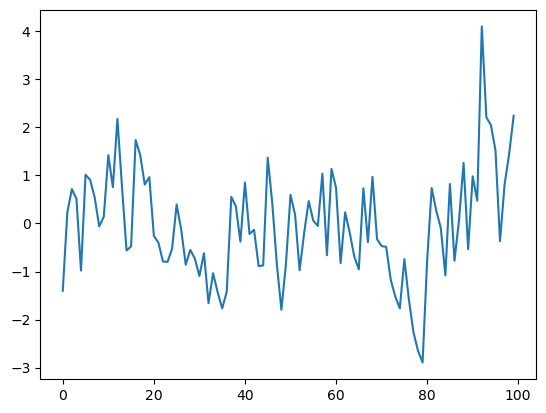

In [38]:
single_time = np.arange(100)
single_snipet = single_cell[400:500]

fig, ax = plt.subplots()
ax.plot(single_time, single_snipet)